In [34]:
# CS3807 - Deep Learning Laboratory
# Experiment 5: Comprehensive Study of CNN Training, Regularization, Optimization,
# Hyperparameter Tuning, Transfer Learning and Cross-Validation
# Dataset: Oxford-IIIT Pet (37-breed classification) | Architecture: MobileNetV2
#
# Assumptions made (manual does not state these explicitly - flag if any is wrong):
#   1. Classification target = 37-way breed classification.
#   2. Full dataset is used throughout (no subset) - confirmed with the user after the
#      initial subset-based version.
#   3. Sections 5-9 apply to the classifier head sitting on a FROZEN MobileNetV2 base.
#
# IMPORTANT - data pipeline: images are streamed from disk via tf.data.Dataset, NOT
# pre-loaded into one giant in-memory NumPy array. Earlier versions of this notebook that
# materialized the full dataset as NumPy arrays crashed Colab's RAM repeatedly, even after
# clearing the Keras session between runs - the giant arrays themselves (~2GB+) plus
# repeated internal copies during training were the real problem. Streaming from disk means
# only a few batches are ever in memory at once, regardless of dataset size or how many
# models get trained in sequence.
#
# KAGGLE SETUP - two settings must be turned on before running (right sidebar in the
# notebook editor), or the cells below will fail or silently run on CPU:
#   1. Settings > Accelerator > GPU (T4 x2 or P100) - otherwise everything runs on CPU
#      and will be extremely slow given how many models this notebook trains.
#   2. Settings > Internet > On - required for the font download, the pip install, and
#      downloading the Oxford-IIIT Pet dataset itself.
# Paths below use /kaggle/working/ (Kaggle's writable directory - equivalent to Colab's
# /content/). Anything saved there automatically appears in the notebook's "Output" panel
# after the session runs; there's no Colab-style files.download() call needed or available.


In [35]:
# ===== CELL 1: Install Times New Roman (for 600 dpi / EPS figures) =====
!apt-get -qq update > /dev/null 2>&1
!echo "ttf-mscorefonts-installer msttcorefonts/accepted-mscorefonts-eula select true" | debconf-set-selections
!apt-get -qq install -y ttf-mscorefonts-installer > /dev/null 2>&1
!fc-cache -f > /dev/null 2>&1
!fc-list | grep -i "times new roman" || echo "NOT FOUND - will need Runtime > Restart session and rerun"


/usr/share/fonts/truetype/msttcorefonts/Times_New_Roman.ttf: Times New Roman:style=Regular,Normal,obyčejné,Standard,Κανονικά,Normaali,Normál,Normale,Standaard,Normalny,Обычный,Normálne,Navadno,thường,Arrunta
/usr/share/fonts/truetype/msttcorefonts/Times_New_Roman_Italic.ttf: Times New Roman:style=Italic,cursiva,kurzíva,kursiv,Πλάγια,Kursivoitu,Italique,Dőlt,Corsivo,Cursief,kursywa,Itálico,Курсив,İtalik,Poševno,nghiêng,Etzana
/usr/share/fonts/truetype/msttcorefonts/timesbd.ttf: Times New Roman:style=Bold,Negreta,tučné,fed,Fett,Έντονα,Negrita,Lihavoitu,Gras,Félkövér,Grassetto,Vet,Halvfet,Pogrubiona,Negrito,Полужирный,Fet,Kalın,Krepko,đậm,Lodia
/usr/share/fonts/truetype/msttcorefonts/Times_New_Roman_Bold_Italic.ttf: Times New Roman:style=Bold Italic,Negreta cursiva,tučné kurzíva,fed kursiv,Fett Kursiv,Έντονα Πλάγια,Negrita Cursiva,Lihavoitu Kursivoi,Gras Italique,Félkövér dőlt,Grassetto Corsivo,Vet Cursief,Halvfet Kursiv,Pogrubiona kursywa,Negrito Itálico,Полужирный Курсив,Tučná kurzíva

In [36]:
# ===== CELL 1b: Fallback font download =====
!wget -q -O /kaggle/working/TimesNewRoman.ttf https://github.com/justrajdeep/fonts/raw/master/Times%20New%20Roman.ttf
!wget -q -O /kaggle/working/times.ttf https://github.com/FSKiller/Microsoft-Fonts/raw/main/times.ttf
!wget -q -O /kaggle/working/timesbd.ttf https://github.com/FSKiller/Microsoft-Fonts/raw/main/timesbd.ttf


In [37]:
# Kaggle already ships scikit-learn/seaborn/matplotlib, so this is normally a fast no-op
# ("already satisfied") rather than a real install - left in for portability, harmless either way.
!pip install -q scikit-learn seaborn matplotlib


In [38]:
# ===== CELL 2: Imports, font config, plot/save configuration =====
import os
import time
import gc
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns

import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, regularizers, initializers
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.utils import to_categorical

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    precision_recall_fscore_support,
    accuracy_score,
)

for f in os.listdir(matplotlib.get_cachedir()):
    if 'fontlist' in f:
        os.remove(os.path.join(matplotlib.get_cachedir(), f))
fm.fontManager = fm.FontManager()

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
plt.rcParams['savefig.dpi'] = 600
plt.rcParams['figure.dpi'] = 600
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 13

PLOT_DIR = "/kaggle/working/plots"
os.makedirs(PLOT_DIR, exist_ok=True)

def save_plot(fig, name):
    path = os.path.join(PLOT_DIR, f"{name}.eps")
    fig.savefig(path, format='eps', dpi=600, bbox_inches='tight')
    print(f"Saved: {path}")

SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

print("TensorFlow version:", tf.__version__)
gpus = tf.config.list_physical_devices('GPU')
print("GPU available:", gpus)
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)


TensorFlow version: 2.20.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [39]:
# ===== SECTION 3: Dataset and Experimental Setup =====
# Downloads directly from the dataset's official source (Oxford VGG group). Only the
# annotation lists (filenames + labels - cheap text files) are parsed here; no image
# pixels are loaded into memory at this stage.
import re
import tarfile
import urllib.request

DATA_DIR = "/kaggle/working/oxford_pets"
os.makedirs(DATA_DIR, exist_ok=True)
IMAGES_DIR = os.path.join(DATA_DIR, "images")
ANNOTATIONS_DIR = os.path.join(DATA_DIR, "annotations")

def download_and_extract(url, dest_dir):
    fname = os.path.join(dest_dir, os.path.basename(url))
    if not os.path.exists(fname):
        print(f"Downloading {url} (this can take a few minutes) ...")
        urllib.request.urlretrieve(url, fname)
    print(f"Extracting {fname} ...")
    with tarfile.open(fname) as tar:
        tar.extractall(dest_dir)

if not os.path.isdir(IMAGES_DIR):
    download_and_extract("https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz", DATA_DIR)
if not os.path.isdir(ANNOTATIONS_DIR):
    download_and_extract("https://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz", DATA_DIR)

def parse_list_file(path):
    entries = []
    with open(path) as f:
        for line in f:
            line = line.strip()
            if not line or line.startswith("#"):
                continue
            image_name, class_id, species, breed_id = line.split()
            entries.append((image_name, int(class_id)))  # class_id is 1-indexed
    return entries

trainval_entries = parse_list_file(os.path.join(ANNOTATIONS_DIR, "trainval.txt"))
test_entries = parse_list_file(os.path.join(ANNOTATIONS_DIR, "test.txt"))

def name_from_image_id(image_name):
    return re.sub(r"_\d+$", "", image_name)

class_id_to_name = {}
for image_name, class_id in trainval_entries + test_entries:
    class_id_to_name.setdefault(class_id, name_from_image_id(image_name))

NUM_CLASSES = len(class_id_to_name)
CLASS_NAMES = [class_id_to_name[i] for i in range(1, NUM_CLASSES + 1)]
print(f"Number of breeds (classes): {NUM_CLASSES}")
print(f"Trainval entries: {len(trainval_entries)} | Test entries: {len(test_entries)}")


Number of breeds (classes): 37
Trainval entries: 3680 | Test entries: 3669


In [40]:
# ===== Fixed stratified 80/20 train/validation split of trainval_entries (used by every
# comparative study - built once so it's identical across all of them) =====
def stratified_split_entries(entries, val_frac, num_classes, seed=SEED):
    rng = np.random.RandomState(seed)
    by_class = {c: [] for c in range(1, num_classes + 1)}
    for name, cid in entries:
        by_class[cid].append(name)
    train_e, val_e = [], []
    for c in range(1, num_classes + 1):
        names = list(by_class[c])
        rng.shuffle(names)
        n_val = max(1, int(round(len(names) * val_frac)))
        val_e.extend((n, c) for n in names[:n_val])
        train_e.extend((n, c) for n in names[n_val:])
    rng.shuffle(train_e)
    rng.shuffle(val_e)
    return train_e, val_e

train_entries, val_entries = stratified_split_entries(trainval_entries, val_frac=0.2, num_classes=NUM_CLASSES)
print(f"Train: {len(train_entries)} | Val: {len(val_entries)}")

QUICK_EPOCHS = 6
CV_EPOCHS = 5
FINAL_EPOCHS = 15
IMG_SIZE = (224, 224)


Train: 2944 | Val: 736


In [41]:
# ===== SECTION 4/5-9 shared infrastructure: streaming data pipeline + model builder =====
def _load_and_preprocess(path, label):
    img = tf.io.read_file(path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, IMG_SIZE)
    img = preprocess_input(img)
    label = tf.one_hot(label, NUM_CLASSES)
    return img, label

def make_dataset(entries, images_dir, batch_size=32, shuffle=True, seed=SEED):
    """Builds a tf.data.Dataset that streams images from disk per-batch, rather than
    loading them all into memory upfront. entries: list of (image_name, class_id)."""
    paths = [os.path.join(images_dir, name + ".jpg") for name, _ in entries]
    labels = [cid - 1 for _, cid in entries]
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    if shuffle:
        ds = ds.shuffle(buffer_size=len(paths), seed=seed, reshuffle_each_iteration=True)
    ds = ds.map(_load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

def reset_tf_state():
    """Frees TensorFlow/Keras's accumulated internal graph state between repeated
    model-building calls."""
    tf.keras.backend.clear_session()
    gc.collect()

def build_pet_model(dense_units=128, init_scheme="glorot_uniform", use_l2=False,
                     dropout_rate=0.0, use_batchnorm=False, optimizer_name="adam",
                     learning_rate=0.001, frozen="all", unfreeze_from=None):
    base = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights="imagenet")
    if frozen == "all":
        base.trainable = False
    else:
        base.trainable = True
        cut = unfreeze_from if unfreeze_from is not None else len(base.layers) - 30
        for layer in base.layers[:cut]:
            layer.trainable = False

    reg = regularizers.l2(0.001) if use_l2 else None

    inputs = layers.Input(shape=(224, 224, 3))
    x = base(inputs)
    x = layers.GlobalAveragePooling2D()(x)
    if use_batchnorm:
        x = layers.BatchNormalization()(x)
    x = layers.Dense(dense_units, activation="relu", kernel_initializer=init_scheme,
                      kernel_regularizer=reg)(x)
    if dropout_rate > 0:
        x = layers.Dropout(dropout_rate)(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax", kernel_initializer=init_scheme)(x)

    model = models.Model(inputs, outputs)
    opt = {
        "sgd": optimizers.SGD(learning_rate=learning_rate),
        "momentum": optimizers.SGD(learning_rate=learning_rate, momentum=0.9),
        "rmsprop": optimizers.RMSprop(learning_rate=learning_rate),
        "adam": optimizers.Adam(learning_rate=learning_rate),
    }[optimizer_name]
    model.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["accuracy"])
    return model, base

def train_short(model, train_e, val_e, epochs=QUICK_EPOCHS, batch_size=32, tag=""):
    train_ds = make_dataset(train_e, IMAGES_DIR, batch_size=batch_size, shuffle=True)
    val_ds = make_dataset(val_e, IMAGES_DIR, batch_size=batch_size, shuffle=False)
    t0 = time.time()
    h = model.fit(train_ds, validation_data=val_ds, epochs=epochs, verbose=0)
    dt = time.time() - t0
    print(f"[{tag}] final val_accuracy={h.history['val_accuracy'][-1]:.4f}  time={dt:.1f}s")
    return h, dt

def plot_multi_curve(histories, key, title, ylabel, filename):
    fig, ax = plt.subplots(figsize=(8, 5.5))
    for label, h in histories.items():
        ax.plot(h.history[key], label=label)
    ax.set_xlabel("Epoch"); ax.set_ylabel(ylabel); ax.set_title(title); ax.legend()
    fig.tight_layout()
    save_plot(fig, filename)
    plt.show()

def plot_train_val(history, metric_pair, title, filename):
    train_key, val_key = metric_pair
    fig, ax = plt.subplots(figsize=(7, 5))
    ax.plot(history.history[train_key], label=f"Training {train_key.split('_')[-1].title() if '_' not in train_key else train_key}")
    ax.plot(history.history[val_key], label=f"Validation {val_key.split('val_')[-1].title()}")
    ax.set_xlabel("Epoch"); ax.set_title(title); ax.legend()
    fig.tight_layout()
    save_plot(fig, filename)
    plt.show()

def bar_from_dict(results_dict, xlabel, ylabel, title, filename):
    fig, ax = plt.subplots(figsize=(8, 5.5))
    keys = [str(k) for k in results_dict.keys()]
    vals = list(results_dict.values())
    bars = ax.bar(keys, vals, color=sns.color_palette("mako", len(keys)))
    ax.set_xlabel(xlabel); ax.set_ylabel(ylabel); ax.set_title(title)
    for b in bars:
        ax.text(b.get_x() + b.get_width()/2, b.get_height(), f"{b.get_height():.3f}",
                ha="center", va="bottom")
    fig.tight_layout()
    save_plot(fig, filename)
    plt.show()


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[init=Zero] final val_accuracy=0.0272  time=36.7s


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[init=Random] final val_accuracy=0.9117  time=36.0s


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[init=Glorot (Xavier)] final val_accuracy=0.9158  time=36.0s


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[init=He] final val_accuracy=0.9117  time=36.2s


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/01_plot1_init_training_loss.eps


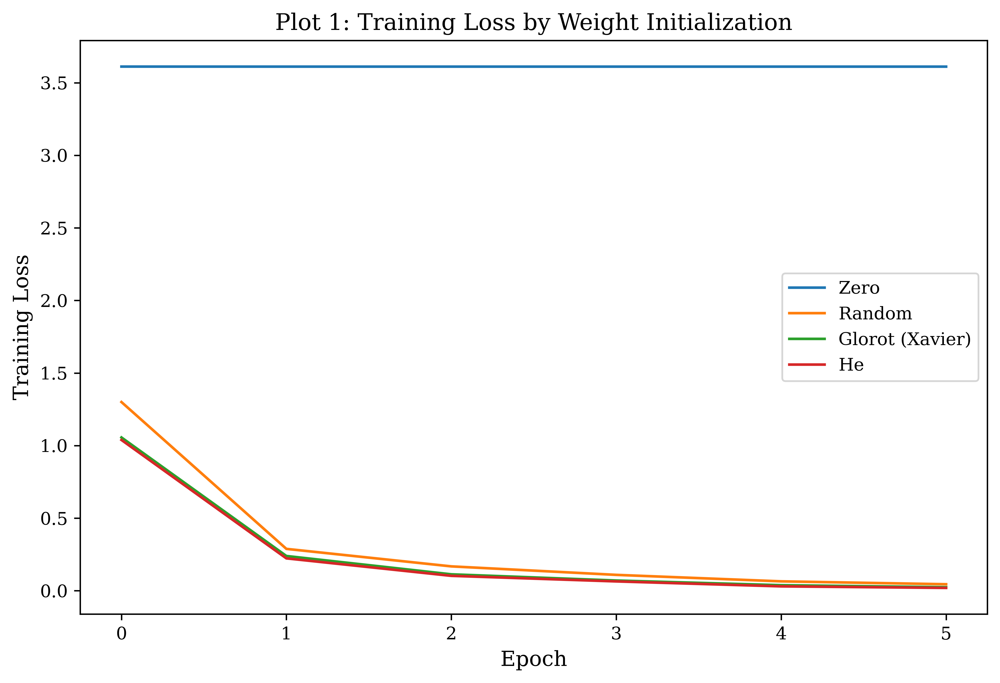

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/02_plot2_init_val_accuracy.eps


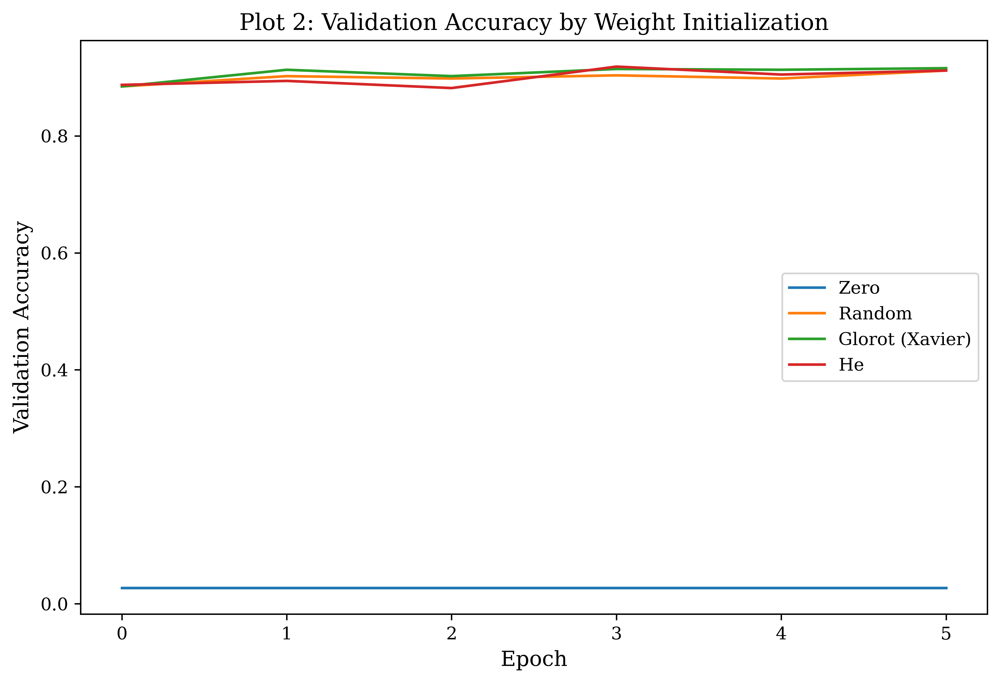

In [42]:
# ===== SECTION 5: Weight Initialization =====
# Zero / Random / Xavier(Glorot) / He initialization, applied to the classifier head.
init_schemes = {
    "Zero": initializers.Zeros(),
    "Random": initializers.RandomNormal(stddev=0.05, seed=SEED),
    "Glorot (Xavier)": initializers.GlorotUniform(seed=SEED),
    "He": initializers.HeNormal(seed=SEED),
}

init_histories = {}
for name, scheme in init_schemes.items():
    m, _ = build_pet_model(init_scheme=scheme)
    h, _ = train_short(m, train_entries, val_entries, tag=f"init={name}")
    init_histories[name] = h
    del m
    reset_tf_state()

# Plot 1: Training Loss vs Epoch (one curve per initialization method)
plot_multi_curve(init_histories, "loss", "Plot 1: Training Loss by Weight Initialization",
                  "Training Loss", "01_plot1_init_training_loss")
# Plot 2: Validation Accuracy vs Epoch (one curve per initialization method)
plot_multi_curve(init_histories, "val_accuracy", "Plot 2: Validation Accuracy by Weight Initialization",
                  "Validation Accuracy", "02_plot2_init_val_accuracy")
# Inference: identify which curve converges fastest / reaches the highest, most stable
# validation accuracy, and note whether Zero-init visibly fails to learn (symmetric weights).


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[reg=No Regularization] final val_accuracy=0.9049  time=35.8s


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/03_plot3_regularization_no_regularization_accuracy.eps


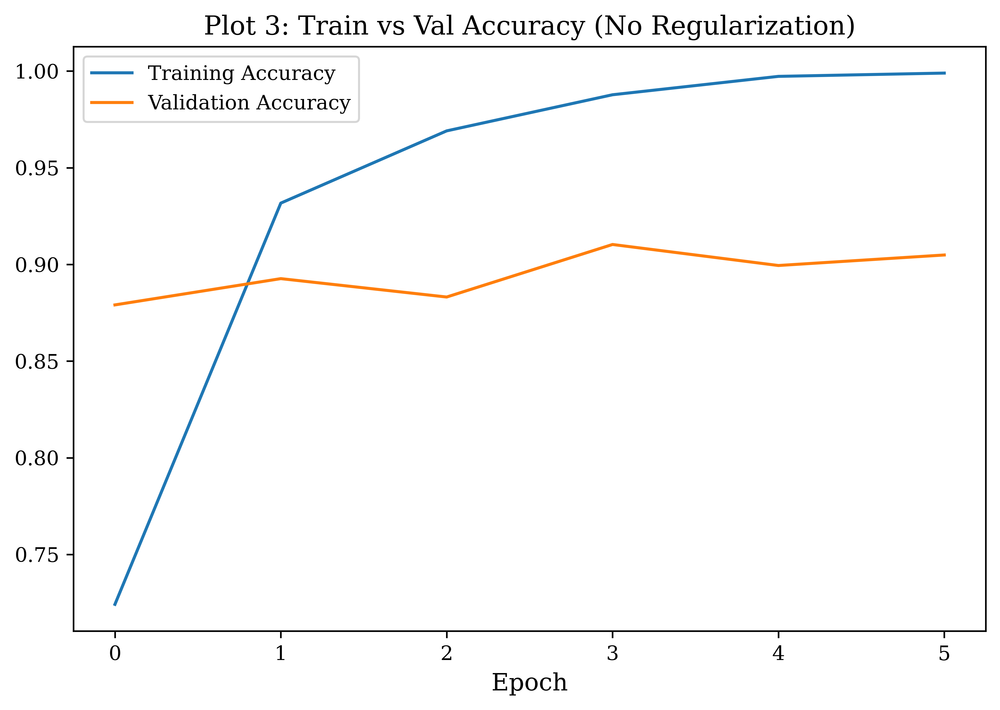

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/04_plot4_regularization_no_regularization_loss.eps


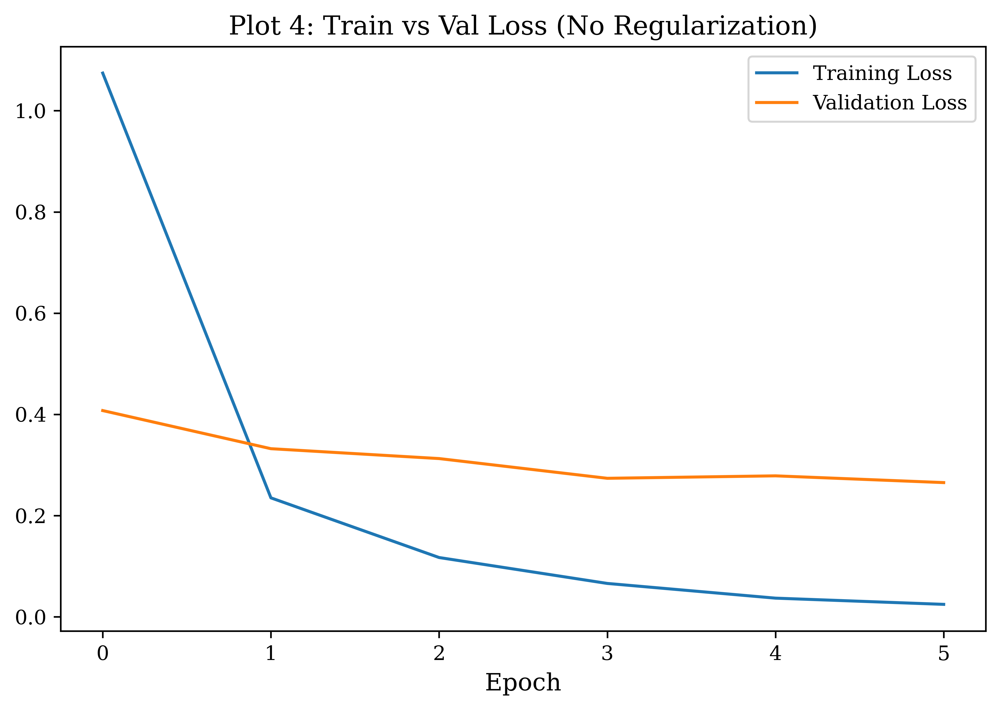

Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[reg=L2] final val_accuracy=0.9022  time=36.5s


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/03_plot3_regularization_l2_accuracy.eps


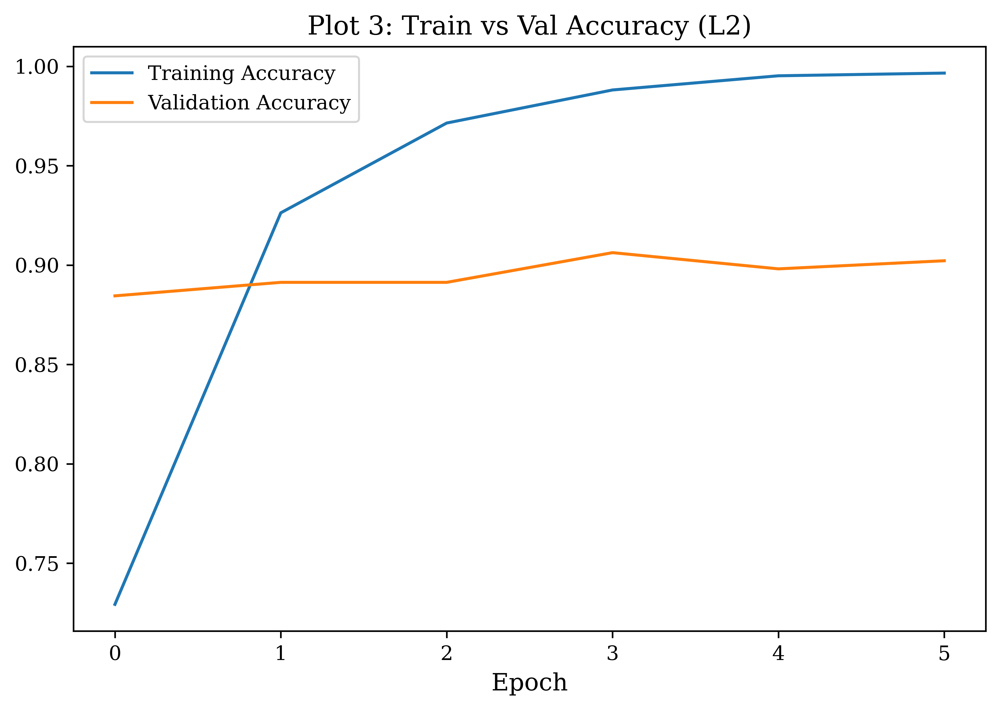

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/04_plot4_regularization_l2_loss.eps


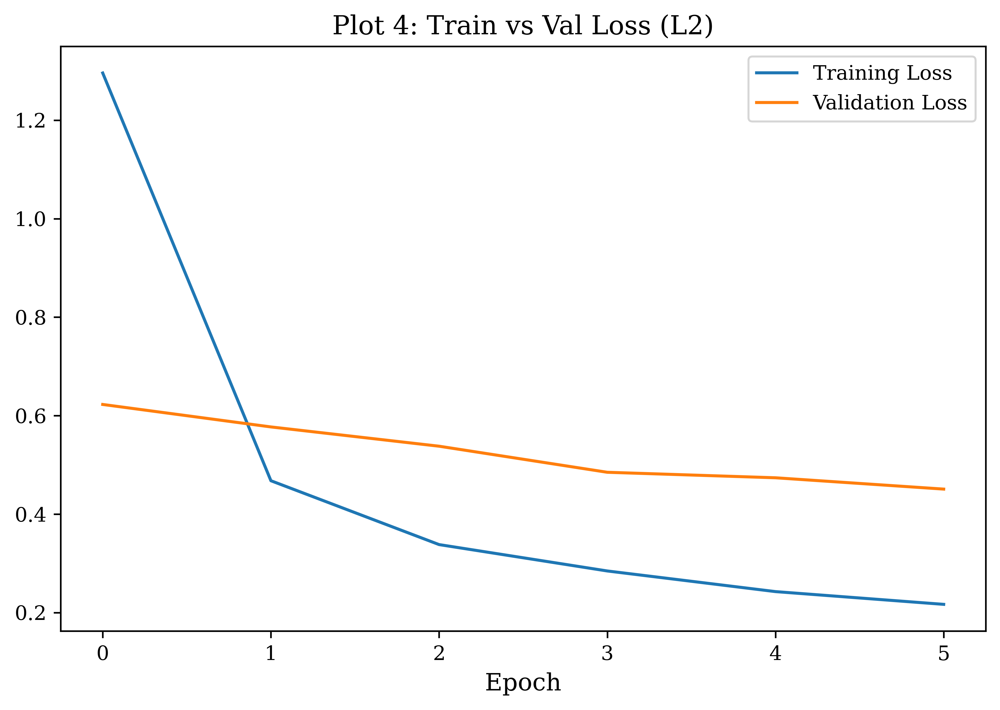

Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[reg=Dropout] final val_accuracy=0.9130  time=36.7s


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/03_plot3_regularization_dropout_accuracy.eps


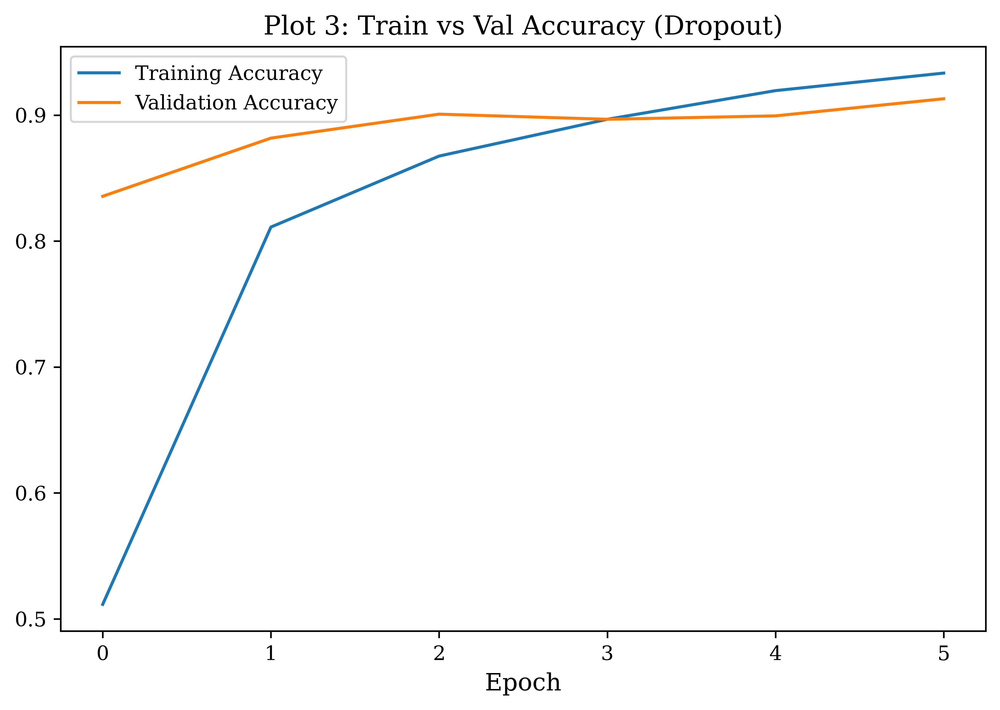

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/04_plot4_regularization_dropout_loss.eps


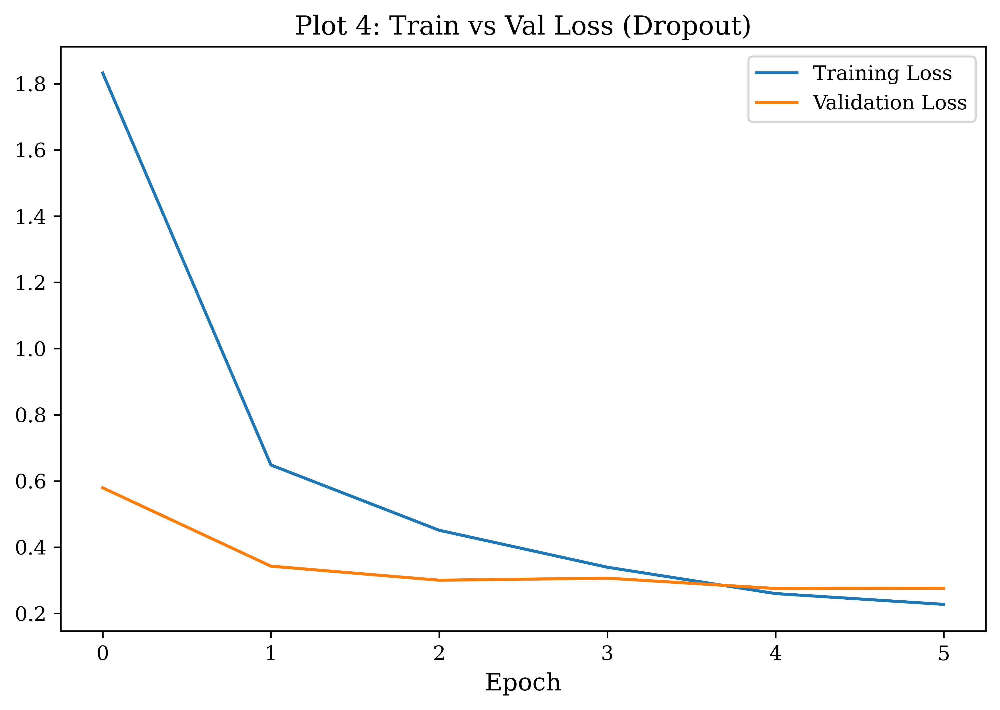

Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[reg=BatchNorm] final val_accuracy=0.9090  time=36.5s


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/03_plot3_regularization_batchnorm_accuracy.eps


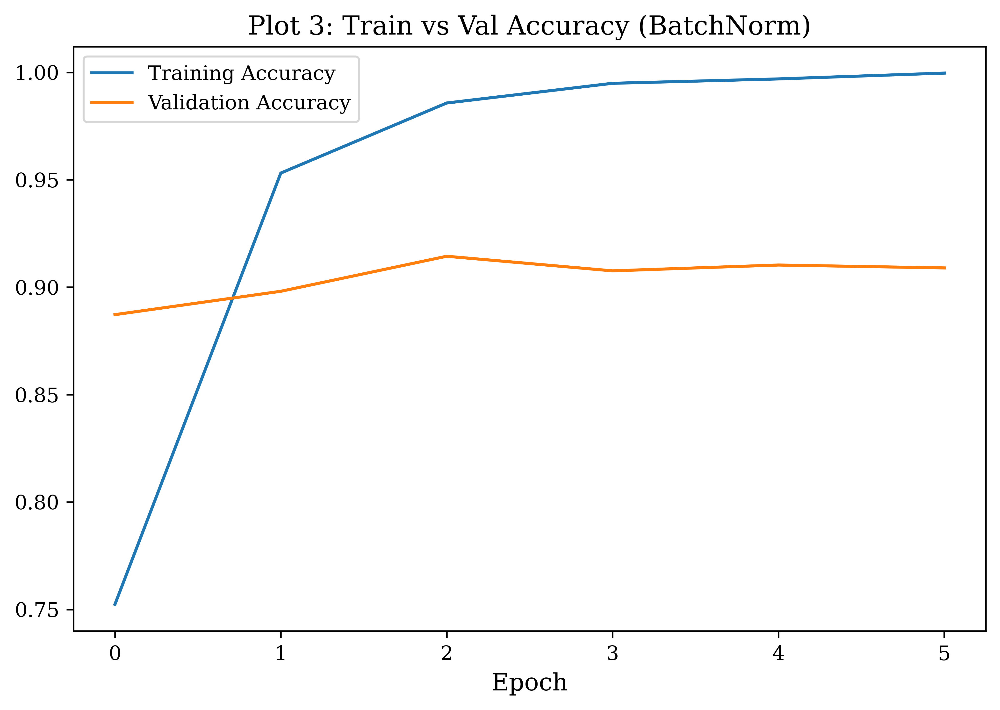

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/04_plot4_regularization_batchnorm_loss.eps


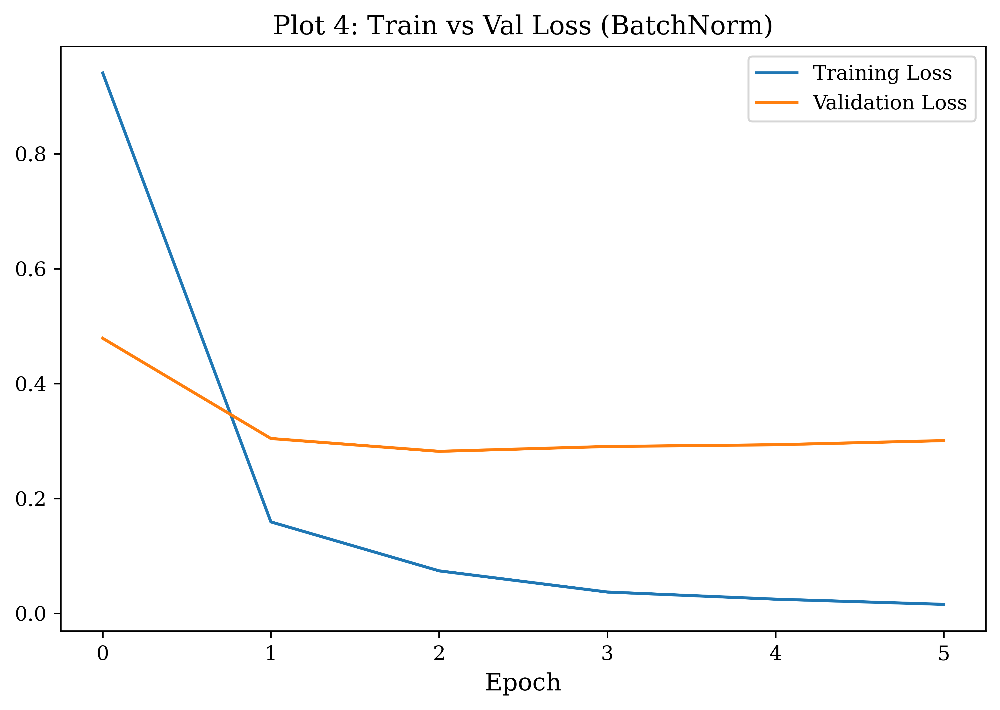

In [43]:
# ===== SECTION 6: Regularization and Overfitting =====
# No regularization / L2 / Dropout / Batch Normalization, each producing its own
# train-vs-validation accuracy and loss plot (to inspect that configuration's own gap).
reg_configs = {
    "No Regularization": dict(use_l2=False, dropout_rate=0.0, use_batchnorm=False),
    "L2": dict(use_l2=True, dropout_rate=0.0, use_batchnorm=False),
    "Dropout": dict(use_l2=False, dropout_rate=0.5, use_batchnorm=False),
    "BatchNorm": dict(use_l2=False, dropout_rate=0.0, use_batchnorm=True),
}

reg_histories = {}
for name, cfg in reg_configs.items():
    m, _ = build_pet_model(**cfg)
    h, _ = train_short(m, train_entries, val_entries, tag=f"reg={name}")
    reg_histories[name] = h
    del m
    reset_tf_state()

    safe_name = name.lower().replace(" ", "_")
    # Plot 3: Training and Validation Accuracy vs Epoch (this configuration)
    plot_train_val(h, ("accuracy", "val_accuracy"),
                    f"Plot 3: Train vs Val Accuracy ({name})",
                    f"03_plot3_regularization_{safe_name}_accuracy")
    # Plot 4: Training and Validation Loss vs Epoch (this configuration)
    plot_train_val(h, ("loss", "val_loss"),
                    f"Plot 4: Train vs Val Loss ({name})",
                    f"04_plot4_regularization_{safe_name}_loss")
# Inference: identify the generalization gap (train vs val accuracy divergence) and whether
# validation loss starts rising while training loss keeps falling, per configuration.


In [44]:
# ===== SECTION 7: Batch Normalization =====
# Numerical example reproduced from the manual, computed directly rather than by hand.
x_bn_example = np.array([2.0, 4.0, 6.0, 8.0])
mu_B = x_bn_example.mean()
var_B = x_bn_example.var()
x_hat = (x_bn_example - mu_B) / np.sqrt(var_B + 1e-8)
print(f"mu_B = {mu_B}")
print(f"var_B = {var_B}")
print(f"sqrt(var_B) = {np.sqrt(var_B):.3f}")
print(f"x_hat = {np.round(x_hat, 3)}")
# With gamma=1, beta=0, y_i = x_hat_i (final outputs equal the normalized values above).


mu_B = 5.0
var_B = 5.0
sqrt(var_B) = 2.236
x_hat = [-1.342 -0.447  0.447  1.342]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/05_plot5_batchnorm_comparison.eps


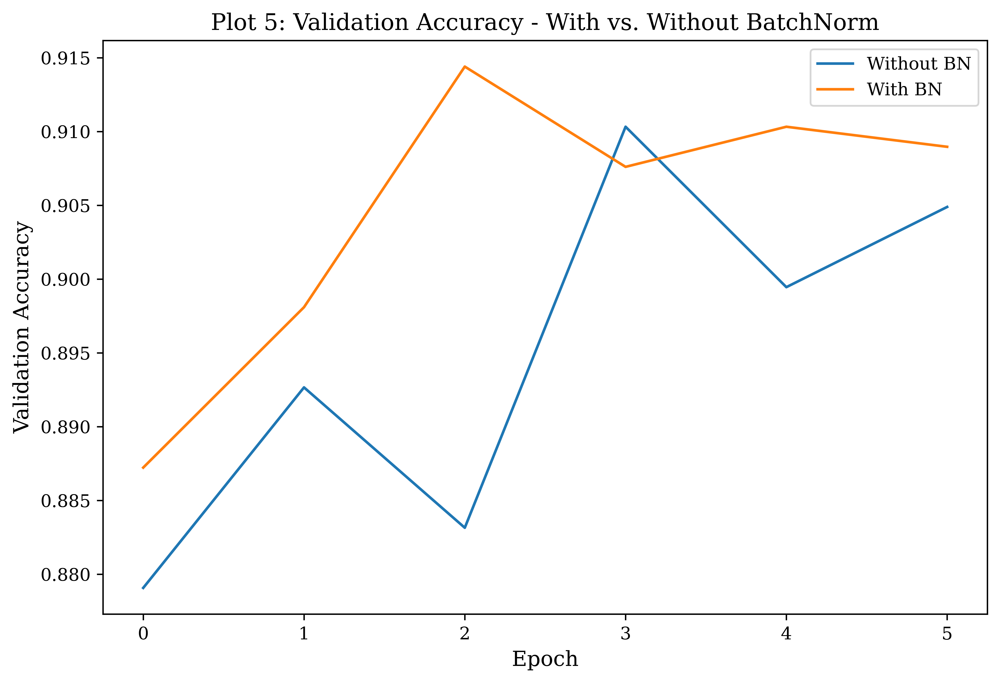

In [45]:
# ===== Plot 5: With vs. Without BatchNorm (Validation Accuracy vs Epoch) =====
# Reuses the "No Regularization" and "BatchNorm" histories already trained in Section 6.
bn_compare = {
    "Without BN": reg_histories["No Regularization"],
    "With BN": reg_histories["BatchNorm"],
}
plot_multi_curve(bn_compare, "val_accuracy", "Plot 5: Validation Accuracy - With vs. Without BatchNorm",
                  "Validation Accuracy", "05_plot5_batchnorm_comparison")


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[optimizer=sgd] final val_accuracy=0.8913  time=35.2s


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[optimizer=momentum] final val_accuracy=0.9185  time=35.4s


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[optimizer=rmsprop] final val_accuracy=0.9198  time=36.8s


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[optimizer=adam] final val_accuracy=0.9144  time=35.9s


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/06_plot6_optimizer_training_loss.eps


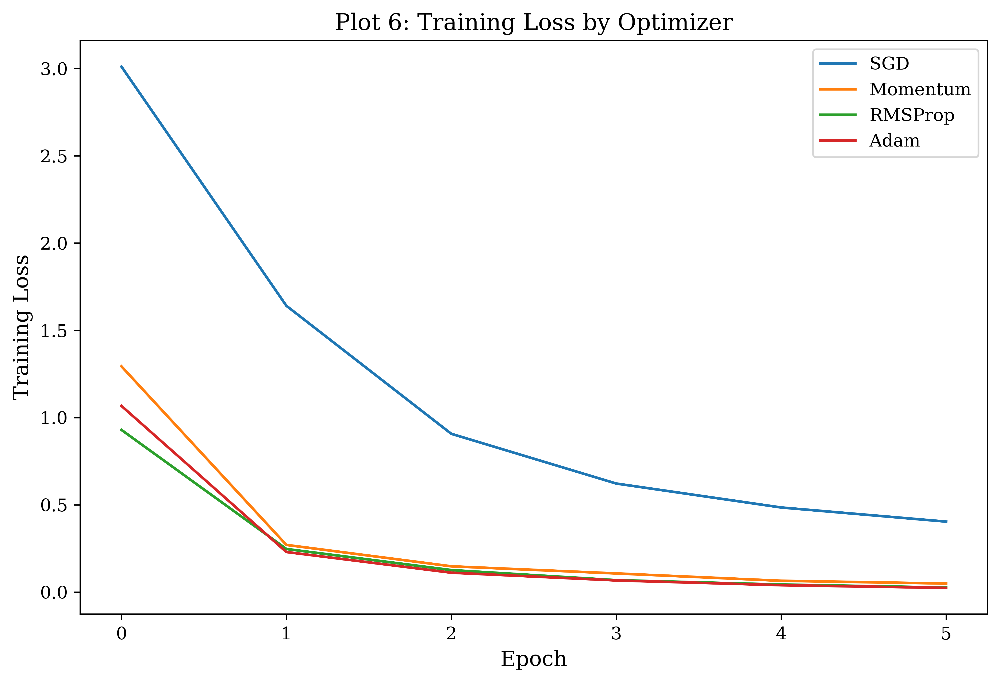

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/07_plot7_optimizer_val_accuracy.eps


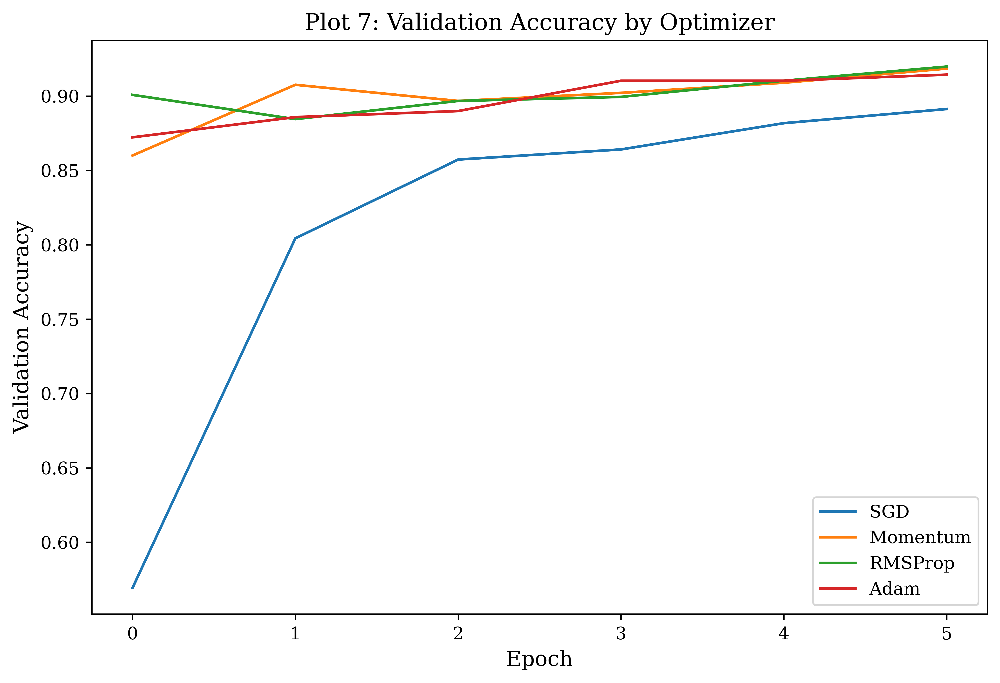

In [46]:
# ===== SECTION 8: Optimization Algorithms =====
# SGD / Momentum / RMSProp / Adam, on the classifier head.
optimizer_configs = ["sgd", "momentum", "rmsprop", "adam"]
opt_display_names = {"sgd": "SGD", "momentum": "Momentum", "rmsprop": "RMSProp", "adam": "Adam"}

opt_histories = {}
opt_times = {}
for opt_name in optimizer_configs:
    m, _ = build_pet_model(optimizer_name=opt_name, learning_rate=0.01 if opt_name in ("sgd", "momentum") else 0.001)
    h, dt = train_short(m, train_entries, val_entries, tag=f"optimizer={opt_name}")
    opt_histories[opt_display_names[opt_name]] = h
    opt_times[opt_display_names[opt_name]] = dt
    del m
    reset_tf_state()

# Plot 6: Training Loss vs Epoch, one curve per optimizer
plot_multi_curve(opt_histories, "loss", "Plot 6: Training Loss by Optimizer",
                  "Training Loss", "06_plot6_optimizer_training_loss")
# Plot 7: Validation Accuracy vs Epoch, one curve per optimizer
plot_multi_curve(opt_histories, "val_accuracy", "Plot 7: Validation Accuracy by Optimizer",
                  "Validation Accuracy", "07_plot7_optimizer_val_accuracy")


In [47]:
# ===== Optimizer comparison table =====
optimizer_table_lines = [f"{'Optimizer':12s}{'Final Loss':>12s}{'Best Val Acc':>15s}{'Epoch to Converge':>20s}{'Time(s)':>10s}"]
for name, h in opt_histories.items():
    final_loss = h.history["loss"][-1]
    best_val_acc = max(h.history["val_accuracy"])
    epoch_to_converge = int(np.argmax(h.history["val_accuracy"])) + 1
    optimizer_table_lines.append(
        f"{name:12s}{final_loss:>12.4f}{best_val_acc:>15.4f}{epoch_to_converge:>20d}{opt_times[name]:>10.1f}"
    )
optimizer_table_text = "\n".join(optimizer_table_lines)
print(optimizer_table_text)
with open(os.path.join(PLOT_DIR, "08_optimizer_comparison_table.txt"), "w") as f:
    f.write(optimizer_table_text)


Optimizer     Final Loss   Best Val Acc   Epoch to Converge   Time(s)
SGD               0.4040         0.8913                   6      35.2
Momentum          0.0492         0.9185                   6      35.4
RMSProp           0.0263         0.9198                   6      36.8
Adam              0.0242         0.9144                   6      35.9


In [48]:
# ===== SECTION 9: CNN Hyperparameter Tuning =====
# Output-dimension formula demo: O = floor((N + 2P - K) / S) + 1
def conv_output_size(N, K, P, S):
    return (N + 2 * P - K) // S + 1

print("Example: N=224, K=3, P=1, S=1 ->", conv_output_size(224, 3, 1, 1))
print("Example: N=224, K=3, P=1, S=2 ->", conv_output_size(224, 3, 1, 2))


Example: N=224, K=3, P=1, S=1 -> 224
Example: N=224, K=3, P=1, S=2 -> 112


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[lr=0.001] final val_accuracy=0.9185  time=36.2s


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[lr=0.0001] final val_accuracy=0.8764  time=36.0s
Saved: /kaggle/working/plots/09_plot8_lr_vs_accuracy.eps


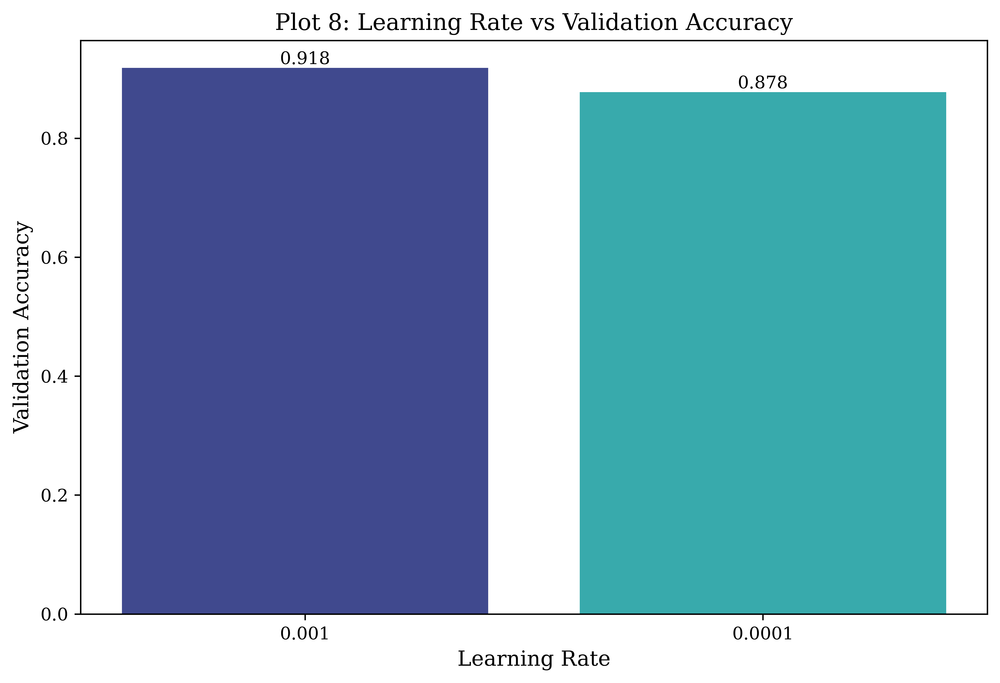

In [49]:
# ===== Plot 8: Learning Rate vs Validation Accuracy =====
lr_results = {}
for lr in [0.001, 0.0001]:
    m, _ = build_pet_model(learning_rate=lr)
    h, _ = train_short(m, train_entries, val_entries, tag=f"lr={lr}")
    lr_results[lr] = max(h.history["val_accuracy"])
    del m
    reset_tf_state()

bar_from_dict(lr_results, "Learning Rate", "Validation Accuracy",
              "Plot 8: Learning Rate vs Validation Accuracy", "09_plot8_lr_vs_accuracy")


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[batch=16] final val_accuracy=0.9171  time=38.4s


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[batch=32] final val_accuracy=0.9171  time=36.3s


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[batch=64] final val_accuracy=0.9158  time=39.3s
Saved: /kaggle/working/plots/10_plot9_batch_vs_accuracy.eps


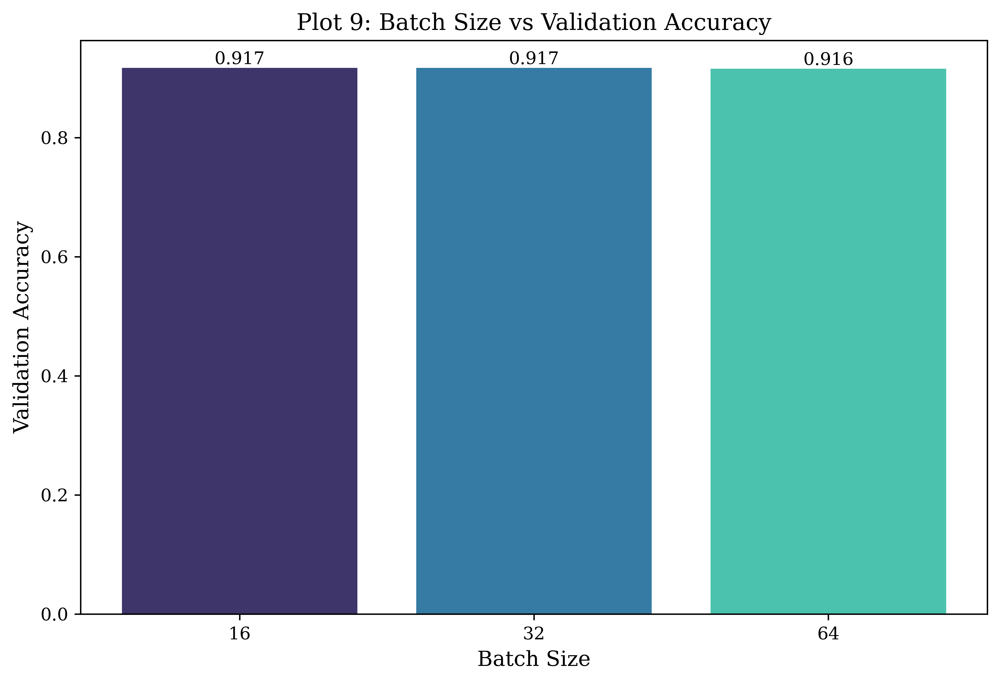

In [50]:
# ===== Plot 9: Batch Size vs Validation Accuracy =====
batch_results = {}
for bs in [16, 32, 64]:
    m, _ = build_pet_model()
    h, _ = train_short(m, train_entries, val_entries, batch_size=bs, tag=f"batch={bs}")
    batch_results[bs] = max(h.history["val_accuracy"])
    del m
    reset_tf_state()

bar_from_dict(batch_results, "Batch Size", "Validation Accuracy",
              "Plot 9: Batch Size vs Validation Accuracy", "10_plot9_batch_vs_accuracy")


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[dropout=0] final val_accuracy=0.9198  time=36.1s


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[dropout=0.25] final val_accuracy=0.9076  time=36.4s


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[dropout=0.5] final val_accuracy=0.9171  time=36.4s
Saved: /kaggle/working/plots/11_plot10_dropout_vs_accuracy.eps


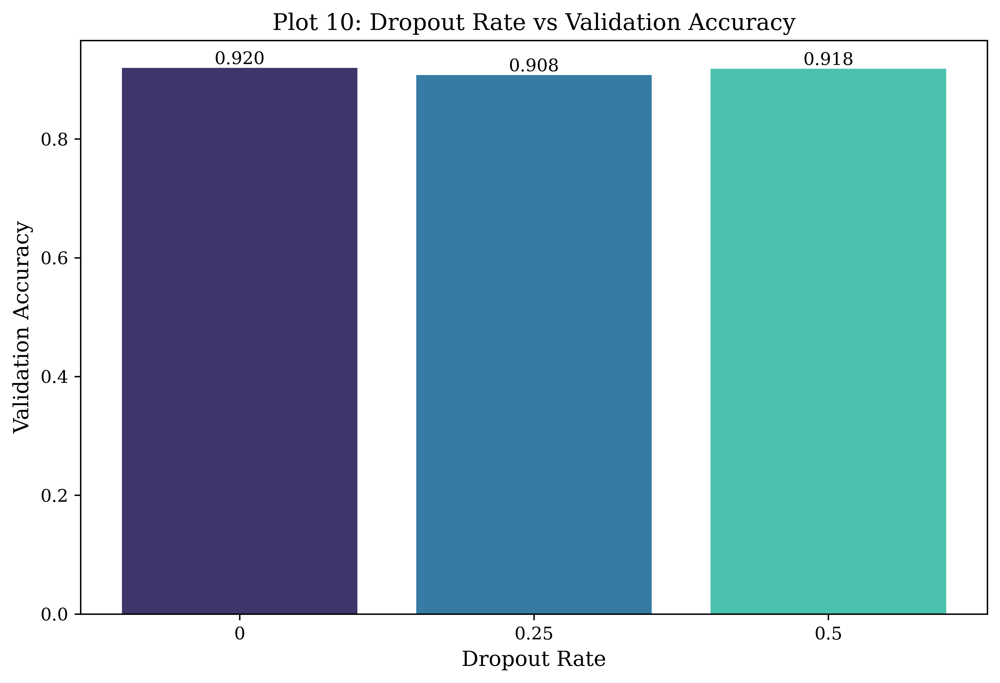

In [51]:
# ===== Plot 10: Dropout Rate vs Validation Accuracy =====
dropout_results = {}
for dr in [0, 0.25, 0.5]:
    m, _ = build_pet_model(dropout_rate=dr)
    h, _ = train_short(m, train_entries, val_entries, tag=f"dropout={dr}")
    dropout_results[dr] = max(h.history["val_accuracy"])
    del m
    reset_tf_state()

bar_from_dict(dropout_results, "Dropout Rate", "Validation Accuracy",
              "Plot 10: Dropout Rate vs Validation Accuracy", "11_plot10_dropout_vs_accuracy")


In [52]:
# ===== SECTION 10: Transfer Learning and Fine-Tuning =====
# Case A: Feature Extraction (frozen base + new classifier)
model_case_a, base_case_a = build_pet_model(frozen="all", learning_rate=0.001)
history_case_a, time_case_a = train_short(model_case_a, train_entries, val_entries,
                                           epochs=QUICK_EPOCHS * 2, tag="Case A: Feature Extraction")
case_a_weights = model_case_a.get_weights()  # saved as plain arrays before any reset
del model_case_a, base_case_a
reset_tf_state()


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extra

[Case A: Feature Extraction] final val_accuracy=0.9076  time=58.3s


In [53]:
# Case B: Fine-Tuning (unfreeze upper layers, small learning rate, continue from Case A weights)
model_case_b, base_case_b = build_pet_model(frozen="partial", learning_rate=1e-5)
model_case_b.set_weights(case_a_weights)
history_case_b, time_case_b = train_short(model_case_b, train_entries, val_entries,
                                           epochs=QUICK_EPOCHS, tag="Case B: Fine-Tuning")
del model_case_b, base_case_b
reset_tf_state()


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Case B: Fine-Tuning] final val_accuracy=0.9090  time=44.6s


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/12_plot11_feature_extraction_vs_finetuning.eps


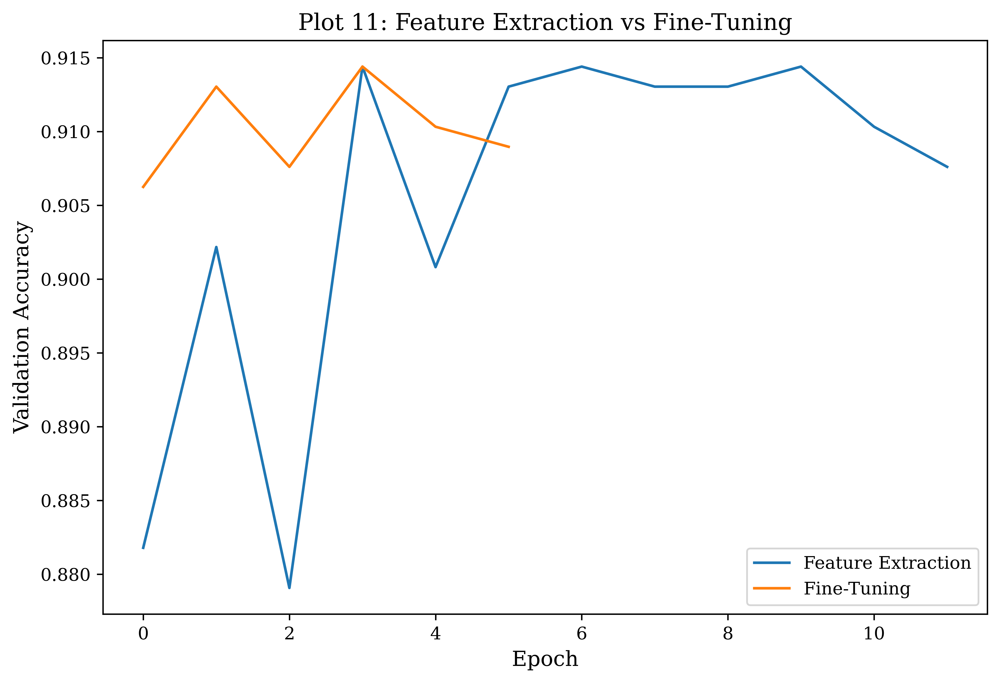

In [54]:
# Plot 11: Feature Extraction vs Fine-Tuning (Validation Accuracy vs Epoch)
case_compare = {"Feature Extraction": history_case_a, "Fine-Tuning": history_case_b}
plot_multi_curve(case_compare, "val_accuracy", "Plot 11: Feature Extraction vs Fine-Tuning",
                  "Validation Accuracy", "12_plot11_feature_extraction_vs_finetuning")


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved: /kaggle/working/plots/13_plot12_finetune_loss_comparison.eps


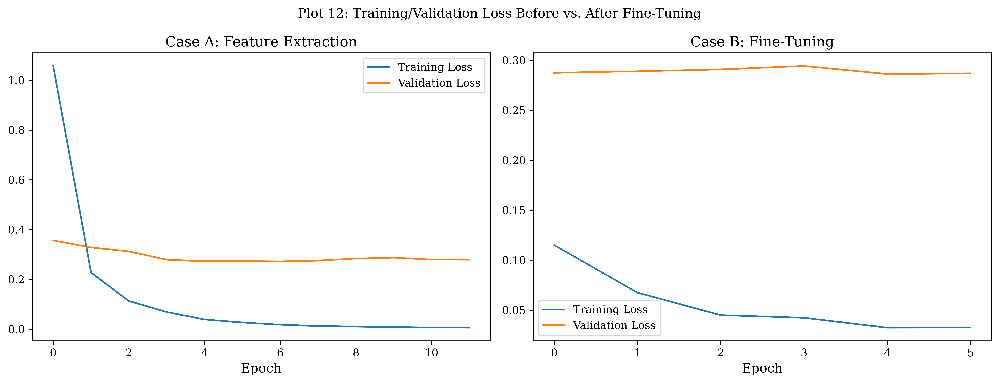

In [55]:
# Plot 12: Training and Validation Loss, before vs after fine-tuning
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
axes[0].plot(history_case_a.history["loss"], label="Training Loss")
axes[0].plot(history_case_a.history["val_loss"], label="Validation Loss")
axes[0].set_title("Case A: Feature Extraction"); axes[0].set_xlabel("Epoch"); axes[0].legend()
axes[1].plot(history_case_b.history["loss"], label="Training Loss")
axes[1].plot(history_case_b.history["val_loss"], label="Validation Loss")
axes[1].set_title("Case B: Fine-Tuning"); axes[1].set_xlabel("Epoch"); axes[1].legend()
fig.suptitle("Plot 12: Training/Validation Loss Before vs. After Fine-Tuning")
fig.tight_layout()
save_plot(fig, "13_plot12_finetune_loss_comparison")
plt.show()

# Discussion: why fine-tuning normally uses a smaller learning rate than a freshly
# initialized classifier - answer in your own words for the report.


In [56]:
# ===== SECTION 11: K-Fold Cross-Validation =====
def run_kfold_cv(build_fn, entries, k=5, epochs=CV_EPOCHS, batch_size=32, tag=""):
    names_arr = np.array([name for name, _ in entries], dtype=object)
    labels_arr = np.array([cid for _, cid in entries])
    skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=SEED)
    fold_accs = []
    for fold_idx, (train_idx, val_idx) in enumerate(skf.split(names_arr, labels_arr), start=1):
        fold_train_e = list(zip(names_arr[train_idx], labels_arr[train_idx]))
        fold_val_e = list(zip(names_arr[val_idx], labels_arr[val_idx]))
        m, _ = build_fn()
        train_ds = make_dataset(fold_train_e, IMAGES_DIR, batch_size=batch_size, shuffle=True)
        val_ds = make_dataset(fold_val_e, IMAGES_DIR, batch_size=batch_size, shuffle=False)
        m.fit(train_ds, epochs=epochs, verbose=0)
        _, acc = m.evaluate(val_ds, verbose=0)
        fold_accs.append(acc)
        print(f"[{tag}] fold {fold_idx}/{k}: val_accuracy={acc:.4f}")
        del m
        reset_tf_state()
    mean_acc = float(np.mean(fold_accs))
    sd_acc = float(np.std(fold_accs))
    print(f"[{tag}] Mean CV Accuracy = {mean_acc:.4f} +/- {sd_acc:.4f}")
    return fold_accs, mean_acc, sd_acc


In [57]:
# Select 3-4 promising configurations based on the earlier studies' results.
best_init_name = max(init_histories, key=lambda k: max(init_histories[k].history["val_accuracy"]))
best_reg_name = max(reg_histories, key=lambda k: max(reg_histories[k].history["val_accuracy"]))
best_opt_name = max(opt_histories, key=lambda k: max(opt_histories[k].history["val_accuracy"]))
best_lr = max(lr_results, key=lr_results.get)
best_batch = max(batch_results, key=batch_results.get)
best_dropout = max(dropout_results, key=dropout_results.get)

print(f"Best init: {best_init_name} | Best reg: {best_reg_name} | Best optimizer: {best_opt_name}")
print(f"Best LR: {best_lr} | Best batch size: {best_batch} | Best dropout: {best_dropout}")

candidate_configs = {
    "Baseline": lambda: build_pet_model(),
    "Best Individual Settings": lambda: build_pet_model(
        init_scheme=init_schemes[best_init_name],
        use_l2=(best_reg_name == "L2"),
        dropout_rate=(0.5 if best_reg_name == "Dropout" else best_dropout),
        use_batchnorm=(best_reg_name == "BatchNorm"),
        optimizer_name={"SGD": "sgd", "Momentum": "momentum", "RMSProp": "rmsprop", "Adam": "adam"}[best_opt_name],
        learning_rate=best_lr,
    ),
    "Best Optimizer + LR Only": lambda: build_pet_model(
        optimizer_name={"SGD": "sgd", "Momentum": "momentum", "RMSProp": "rmsprop", "Adam": "adam"}[best_opt_name],
        learning_rate=best_lr,
    ),
    "Best Regularization Only": lambda: build_pet_model(
        use_l2=(best_reg_name == "L2"),
        dropout_rate=(0.5 if best_reg_name == "Dropout" else 0.0),
        use_batchnorm=(best_reg_name == "BatchNorm"),
    ),
}


Best init: He | Best reg: BatchNorm | Best optimizer: RMSProp
Best LR: 0.001 | Best batch size: 16 | Best dropout: 0


In [58]:
cv_results = {}
for name, build_fn in candidate_configs.items():
    fold_accs, mean_acc, sd_acc = run_kfold_cv(build_fn, trainval_entries, batch_size=best_batch, tag=name)
    cv_results[name] = {"folds": fold_accs, "mean": mean_acc, "sd": sd_acc}

cv_table_lines = [f"{'Configuration':28s}{'F1':>8s}{'F2':>8s}{'F3':>8s}{'F4':>8s}{'F5':>8s}{'Mean+/-SD':>16s}"]
for name, r in cv_results.items():
    fstr = "".join(f"{a:>8.3f}" for a in r["folds"])
    cv_table_lines.append(f"{name:28s}{fstr}{r['mean']:>10.4f} +/- {r['sd']:.4f}")
cv_table_text = "\n".join(cv_table_lines)
print(cv_table_text)
with open(os.path.join(PLOT_DIR, "14_cv_results_table.txt"), "w") as f:
    f.write(cv_table_text)


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


[Baseline] fold 1/5: val_accuracy=0.9144


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Baseline] fold 2/5: val_accuracy=0.9062


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Baseline] fold 3/5: val_accuracy=0.9035


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Baseline] fold 4/5: val_accuracy=0.9198


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Baseline] fold 5/5: val_accuracy=0.9090
[Baseline] Mean CV Accuracy = 0.9106 +/- 0.0059


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


[Best Individual Settings] fold 1/5: val_accuracy=0.9158


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Best Individual Settings] fold 2/5: val_accuracy=0.8940


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Best Individual Settings] fold 3/5: val_accuracy=0.9035


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Best Individual Settings] fold 4/5: val_accuracy=0.8954


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Best Individual Settings] fold 5/5: val_accuracy=0.9130
[Best Individual Settings] Mean CV Accuracy = 0.9043 +/- 0.0089


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


[Best Optimizer + LR Only] fold 1/5: val_accuracy=0.9076


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Best Optimizer + LR Only] fold 2/5: val_accuracy=0.8954


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Best Optimizer + LR Only] fold 3/5: val_accuracy=0.8859


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Best Optimizer + LR Only] fold 4/5: val_accuracy=0.9130


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Best Optimizer + LR Only] fold 5/5: val_accuracy=0.9049
[Best Optimizer + LR Only] Mean CV Accuracy = 0.9014 +/- 0.0096


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


[Best Regularization Only] fold 1/5: val_accuracy=0.9062


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Best Regularization Only] fold 2/5: val_accuracy=0.9022


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Best Regularization Only] fold 3/5: val_accuracy=0.8995


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Best Regularization Only] fold 4/5: val_accuracy=0.8967


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


[Best Regularization Only] fold 5/5: val_accuracy=0.9103
[Best Regularization Only] Mean CV Accuracy = 0.9030 +/- 0.0048
Configuration                     F1      F2      F3      F4      F5       Mean+/-SD
Baseline                       0.914   0.906   0.904   0.920   0.909    0.9106 +/- 0.0059
Best Individual Settings       0.916   0.894   0.904   0.895   0.913    0.9043 +/- 0.0089
Best Optimizer + LR Only       0.908   0.895   0.886   0.913   0.905    0.9014 +/- 0.0096
Best Regularization Only       0.906   0.902   0.899   0.897   0.910    0.9030 +/- 0.0048


Saved: /kaggle/working/plots/15_plot13_cv_accuracy.eps


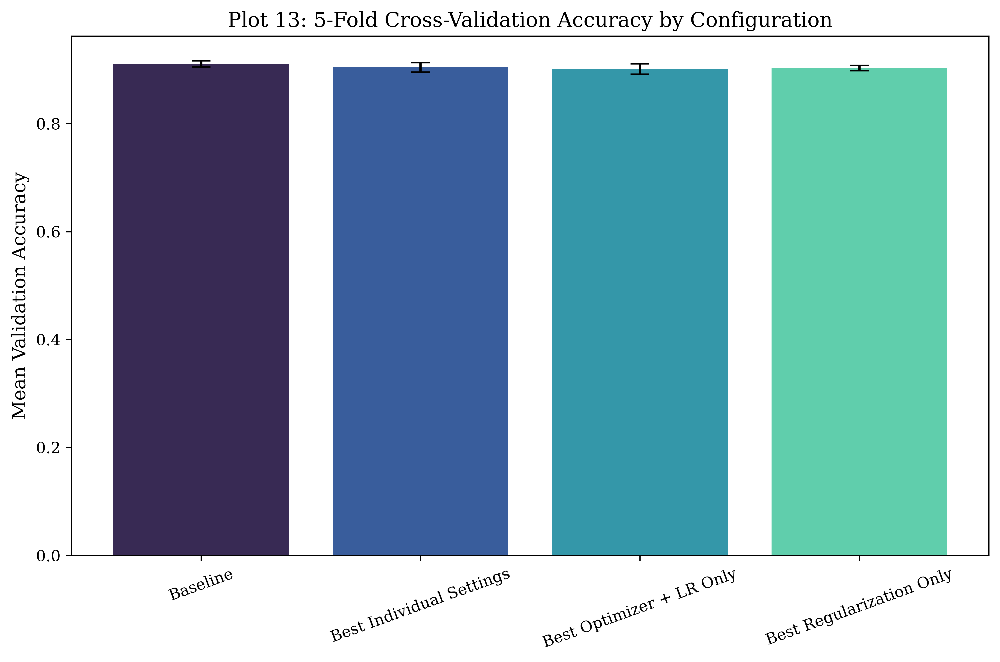

In [59]:
# Plot 13: 5-Fold Cross-Validation Accuracy (mean +/- SD error bars)
fig, ax = plt.subplots(figsize=(9, 6))
names = list(cv_results.keys())
means = [cv_results[n]["mean"] for n in names]
sds = [cv_results[n]["sd"] for n in names]
ax.bar(names, means, yerr=sds, capsize=6, color=sns.color_palette("mako", len(names)))
ax.set_ylabel("Mean Validation Accuracy")
ax.set_title("Plot 13: 5-Fold Cross-Validation Accuracy by Configuration")
ax.tick_params(axis='x', rotation=20)
fig.tight_layout()
save_plot(fig, "15_plot13_cv_accuracy")
plt.show()


In [60]:
# ===== SECTION 12: Final Model Evaluation =====
best_config_name = max(cv_results, key=lambda k: cv_results[k]["mean"])
print(f"Selected configuration (highest mean CV accuracy): {best_config_name}")

final_model, _ = candidate_configs[best_config_name]()

final_train_ds = make_dataset(train_entries, IMAGES_DIR, batch_size=best_batch, shuffle=True)
final_val_ds = make_dataset(val_entries, IMAGES_DIR, batch_size=best_batch, shuffle=False)

t0 = time.time()
final_history = final_model.fit(
    final_train_ds, validation_data=final_val_ds, epochs=FINAL_EPOCHS, verbose=2,
)
final_train_time = time.time() - t0


Selected configuration (highest mean CV accuracy): Baseline
Epoch 1/15


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


184/184 - 17s - 94ms/step - accuracy: 0.7660 - loss: 0.9030 - val_accuracy: 0.8899 - val_loss: 0.3707
Epoch 2/15


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


184/184 - 4s - 23ms/step - accuracy: 0.9409 - loss: 0.1981 - val_accuracy: 0.9022 - val_loss: 0.3119
Epoch 3/15


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


184/184 - 4s - 23ms/step - accuracy: 0.9688 - loss: 0.0952 - val_accuracy: 0.8886 - val_loss: 0.3174
Epoch 4/15


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


184/184 - 4s - 23ms/step - accuracy: 0.9912 - loss: 0.0451 - val_accuracy: 0.9090 - val_loss: 0.2973
Epoch 5/15


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


184/184 - 4s - 23ms/step - accuracy: 0.9932 - loss: 0.0323 - val_accuracy: 0.9144 - val_loss: 0.2706
Epoch 6/15


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


184/184 - 4s - 24ms/step - accuracy: 0.9983 - loss: 0.0137 - val_accuracy: 0.9212 - val_loss: 0.2549
Epoch 7/15


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


184/184 - 4s - 23ms/step - accuracy: 0.9997 - loss: 0.0084 - val_accuracy: 0.9266 - val_loss: 0.2560
Epoch 8/15


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


184/184 - 4s - 23ms/step - accuracy: 1.0000 - loss: 0.0057 - val_accuracy: 0.9307 - val_loss: 0.2533
Epoch 9/15


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


184/184 - 4s - 23ms/step - accuracy: 1.0000 - loss: 0.0042 - val_accuracy: 0.9198 - val_loss: 0.2594
Epoch 10/15


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


184/184 - 4s - 23ms/step - accuracy: 1.0000 - loss: 0.0036 - val_accuracy: 0.9226 - val_loss: 0.2672
Epoch 11/15


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


184/184 - 4s - 23ms/step - accuracy: 1.0000 - loss: 0.0029 - val_accuracy: 0.9239 - val_loss: 0.2603
Epoch 12/15


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


184/184 - 4s - 23ms/step - accuracy: 1.0000 - loss: 0.0025 - val_accuracy: 0.9185 - val_loss: 0.2640
Epoch 13/15


Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


184/184 - 4s - 23ms/step - accuracy: 1.0000 - loss: 0.0021 - val_accuracy: 0.9266 - val_loss: 0.2694
Epoch 14/15


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


184/184 - 4s - 23ms/step - accuracy: 1.0000 - loss: 0.0018 - val_accuracy: 0.9253 - val_loss: 0.2705
Epoch 15/15


Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


184/184 - 4s - 23ms/step - accuracy: 1.0000 - loss: 0.0015 - val_accuracy: 0.9266 - val_loss: 0.2717


In [61]:
# Evaluate on the held-out test set (never touched until now), streamed the same way.
test_ds = make_dataset(test_entries, IMAGES_DIR, batch_size=32, shuffle=False)

final_test_loss, final_test_acc = final_model.evaluate(test_ds, verbose=0)
print(f"Final test accuracy: {final_test_acc:.4f}")

y_pred_probs = final_model.predict(test_ds, verbose=0)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.array([cid - 1 for _, cid in test_entries])  # labels are cheap, no need to reload images


Final test accuracy: 0.8981


In [62]:
# Precision, Recall, F1-score, Classification Report
precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average="macro")
report = classification_report(y_true, y_pred, target_names=CLASS_NAMES, zero_division=0)
print(report)

final_params = final_model.count_params()

final_metrics_text = (
    f"Mean CV Accuracy: {cv_results[best_config_name]['mean']:.4f}\n"
    f"CV Standard Deviation: {cv_results[best_config_name]['sd']:.4f}\n"
    f"Test Accuracy: {final_test_acc:.4f}\n"
    f"Precision (macro): {precision:.4f}\n"
    f"Recall (macro): {recall:.4f}\n"
    f"F1-score (macro): {f1:.4f}\n"
    f"Training Time (s): {final_train_time:.1f}\n"
    f"Number of Parameters: {final_params:,}\n\n"
    f"{report}"
)
print(final_metrics_text)
with open(os.path.join(PLOT_DIR, "16_final_model_metrics.txt"), "w") as f:
    f.write(final_metrics_text)


                            precision    recall  f1-score   support

                Abyssinian       0.79      0.87      0.83        98
          american_bulldog       0.75      0.91      0.82       100
 american_pit_bull_terrier       0.74      0.68      0.71       100
              basset_hound       0.97      0.88      0.92       100
                    beagle       0.88      0.93      0.90       100
                    Bengal       0.70      0.88      0.78       100
                    Birman       0.80      0.77      0.79       100
                    Bombay       0.84      0.93      0.88        88
                     boxer       0.85      0.93      0.89        99
         British_Shorthair       0.85      0.80      0.82       100
                 chihuahua       0.92      0.87      0.89       100
              Egyptian_Mau       0.90      0.79      0.84        97
    english_cocker_spaniel       0.97      0.95      0.96       100
            english_setter       0.97      0.94

In [63]:
# Plot 14: Confusion Matrix (37 classes -> no per-cell numeric annotations, too dense to read)
cm = confusion_matrix(y_true, y_pred)
fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(cm, annot=False, cmap="Blues", xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)
ax.set_title("Plot 14: Confusion Matrix (37 Breeds)")
ax.set_xlabel("Predicted Label"); ax.set_ylabel("True Label")
ax.tick_params(axis='x', rotation=90, labelsize=6)
ax.tick_params(axis='y', rotation=0, labelsize=6)
fig.tight_layout()
save_plot(fig, "17_plot14_confusion_matrix")
plt.show()
# Inspect the heatmap for the strongest diagonal cells (best-classified breeds) and the
# brightest off-diagonal cells (most frequently confused breed pairs).


Saved: /kaggle/working/plots/17_plot14_confusion_matrix.eps


Saved: /kaggle/working/plots/18_plot15_misclassified_images.eps


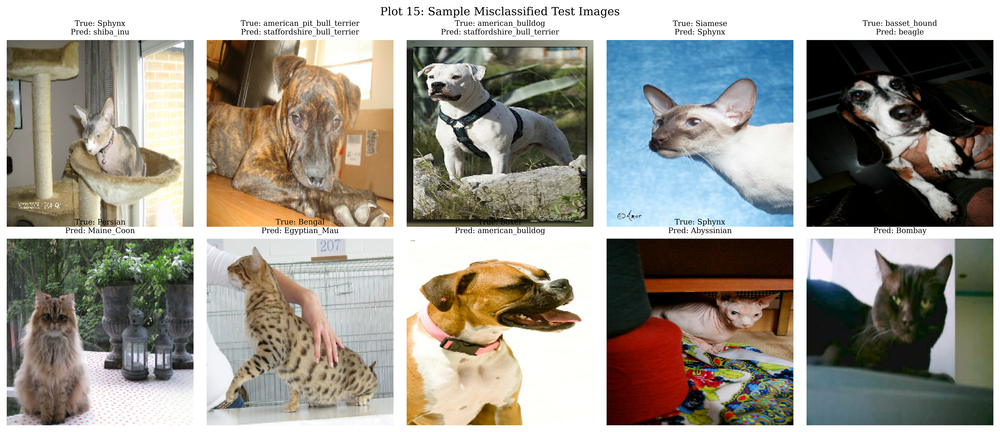

In [64]:
# Plot 15 (Optional): Misclassified Images
# Only the ~10 specific misclassified images actually needed for display are loaded from
# disk here, rather than needing the full test set as an in-memory array.
def deprocess_for_display(img):
    return np.clip((img + 1.0) / 2.0, 0, 1)

def load_single_image(image_name, images_dir, target_size=IMG_SIZE):
    img = tf.io.read_file(os.path.join(images_dir, image_name + ".jpg"))
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, target_size)
    img = preprocess_input(img)
    return img.numpy()

misclassified_idx = np.where(y_pred != y_true)[0]
sample_wrong = np.random.choice(misclassified_idx, size=min(10, len(misclassified_idx)), replace=False)

fig, axes = plt.subplots(2, 5, figsize=(15, 6.5))
for ax, idx in zip(axes.flat, sample_wrong):
    image_name, _ = test_entries[idx]
    img = load_single_image(image_name, IMAGES_DIR)
    ax.imshow(deprocess_for_display(img))
    ax.set_title(f"True: {CLASS_NAMES[y_true[idx]]}\nPred: {CLASS_NAMES[y_pred[idx]]}", fontsize=8)
    ax.axis("off")
fig.suptitle("Plot 15: Sample Misclassified Test Images")
fig.tight_layout()
save_plot(fig, "18_plot15_misclassified_images")
plt.show()


In [65]:
# ===== SECTION 13: Overall Results =====
# NOTE: only the four "candidate_configs" rows above underwent genuine 5-fold CV. The rows
# below reuse each individual study's own best single-run validation accuracy where a
# dedicated CV was not separately computed for that exact configuration; this is flagged
# per row rather than presented as if every row were cross-validated.
overall_rows = [
    ("Baseline", cv_results.get("Baseline", {}).get("mean"), cv_results.get("Baseline", {}).get("sd"), None),
    ("Best Initialization", max(h.history["val_accuracy"][-1] for h in [init_histories[best_init_name]]), None, "single-run, not CV'd"),
    ("Best Regularization", max(reg_histories[best_reg_name].history["val_accuracy"]), None, "single-run, not CV'd"),
    ("Best Optimizer", cv_results.get("Best Optimizer + LR Only", {}).get("mean"),
     cv_results.get("Best Optimizer + LR Only", {}).get("sd"), None),
    ("Best Hyperparameters", cv_results.get("Best Individual Settings", {}).get("mean"),
     cv_results.get("Best Individual Settings", {}).get("sd"), None),
    ("Fine-Tuned Model", max(history_case_b.history["val_accuracy"]), None, "single-run, not CV'd"),
]

overall_lines = [f"{'Configuration':24s}{'CV Accuracy':>14s}{'SD':>10s}{'Test Accuracy':>16s}{'Note':>28s}"]
for name, cv_acc, sd, note in overall_rows:
    cv_str = f"{cv_acc:.4f}" if cv_acc is not None else "N/A"
    sd_str = f"{sd:.4f}" if sd is not None else "N/A"
    note_str = note if note else ""
    test_str = f"{final_test_acc:.4f}" if name == best_config_name.replace("Best Individual Settings", "Best Hyperparameters") else "N/A"
    overall_lines.append(f"{name:24s}{cv_str:>14s}{sd_str:>10s}{test_str:>16s}{note_str:>28s}")
overall_text = "\n".join(overall_lines)
print(overall_text)
with open(os.path.join(PLOT_DIR, "19_overall_results_table.txt"), "w") as f:
    f.write(overall_text)


Configuration              CV Accuracy        SD   Test Accuracy                        Note
Baseline                        0.9106    0.0059          0.8981                            
Best Initialization             0.9117       N/A             N/A        single-run, not CV'd
Best Regularization             0.9144       N/A             N/A        single-run, not CV'd
Best Optimizer                  0.9014    0.0096             N/A                            
Best Hyperparameters            0.9043    0.0089             N/A                            
Fine-Tuned Model                0.9144       N/A             N/A        single-run, not CV'd


In [66]:
# ===== Package all figures & reports (600 dpi EPS) =====
# Kaggle note: no explicit download call needed here (unlike Colab's google.colab.files).
# Anything saved under /kaggle/working/ automatically appears in the notebook's "Output"
# panel/tab once the session finishes running, ready to download from there.
import shutil

zip_path = "/kaggle/working/pet_mobilenetv2_lab_outputs"
shutil.make_archive(zip_path, 'zip', PLOT_DIR)

print("Files in archive:")
for f in sorted(os.listdir(PLOT_DIR)):
    print(" -", f)

print(f"\nZip saved to {zip_path}.zip -- find it in the notebook's Output panel after this run.")


Files in archive:
 - 01_plot1_init_training_loss.eps
 - 02_plot2_init_val_accuracy.eps
 - 03_plot3_regularization_batchnorm_accuracy.eps
 - 03_plot3_regularization_dropout_accuracy.eps
 - 03_plot3_regularization_l2_accuracy.eps
 - 03_plot3_regularization_no_regularization_accuracy.eps
 - 04_plot4_regularization_batchnorm_loss.eps
 - 04_plot4_regularization_dropout_loss.eps
 - 04_plot4_regularization_l2_loss.eps
 - 04_plot4_regularization_no_regularization_loss.eps
 - 05_plot5_batchnorm_comparison.eps
 - 06_plot6_optimizer_training_loss.eps
 - 07_plot7_optimizer_val_accuracy.eps
 - 08_optimizer_comparison_table.txt
 - 09_plot8_lr_vs_accuracy.eps
 - 10_plot9_batch_vs_accuracy.eps
 - 11_plot10_dropout_vs_accuracy.eps
 - 12_plot11_feature_extraction_vs_finetuning.eps
 - 13_plot12_finetune_loss_comparison.eps
 - 14_cv_results_table.txt
 - 15_plot13_cv_accuracy.eps
 - 16_final_model_metrics.txt
 - 17_plot14_confusion_matrix.eps
 - 18_plot15_misclassified_images.eps
 - 19_overall_results_tabl